# CycleGAN, photo-to-painting

In this notebook, we're going to define and train a CycleGAN to read in an image from a set $X$ and transform it so that it looks as if it belongs in set $Y$. Specifically, we'll look at a set of real photos, $X$, and a set of impressionist paintings by [Paul Cézanne](https://en.wikipedia.org/wiki/Paul_C%C3%A9zanne), $Y$. The objective will be to train a CycleGAN so that it learns to transform a real photo into an image that looks like a Cézanne painting (and vice versa). This is called **collection style transfer**, in which we can turn a photo into a painting that looks like it was done by a particular artist, informed by the style of their collected works, rather than style transfer via CNN, which looks at the style of an individual painting.

Some examples of image data in both sets are pictured below.

<img src='notebook_images/XY_images.png' width=70% height=70% />

### Unpaired Training Data
These emoji's do not come with labels, but CycleGANs give us a way to learn this mapping using an **unsupervised** approach. A CycleGAN is designed for image-to-image translation and it learns from un-paired training data. This means that in order to train it to translate images from domain $X$ to domain $Y$, we do not have to have exact correspondences between individual images in those domains. For example, in [the paper that introduced CycleGANs](https://arxiv.org/abs/1703.10593), the authors are able to translate between images of horses and zebras, even though there are no images of a zebra in exactly the same position as a horse, and with exactly the same background, etc. Thus, CycleGANs enable learning a mapping from one domain $X$ (say, realistic photos) to
another domain $Y$ (paintings) without having to find perfectly matched training pairs!

<img src='notebook_images/photo2painting.png' width=40% height=40% />

### CycleGAN and Notebook Structure

A CycleGAN is made of two types of networks: a discriminator, and a generator. In this example, the discriminator is responsible for classifying images as real or fake (for both $X$ and $Y$ kinds of images). The generator is responsible for generating convincing, fake images for both sets of image data. 

This notebook will detail the steps you should take to define and train such a CycleGAN. 

1. You'll load in the image data using PyTorch's DataLoader class to efficiently read in images from a specified directory. 

2. Then, you'll be tasked with defining the CycleGAN architecture according to provided specifications. You'll define the discriminator and the generator models.

3. You'll complete the training cycle by calculating the adversarial and cycle consistency losses for the generator and discriminator network and completing a number of training epochs. *It's suggested that you enable GPU usage for training.*

4. Finally, you'll evaluate your model by looking at the loss over time and looking at sample, generated images.


---

## Load and Visualize the Data

We'll first load in and visualize the training data, importing the necessary libraries to do so.

In [1]:
# loading in and transforming data
import os
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms

# visualizing data
import matplotlib.pyplot as plt
import numpy as np
import warnings

# watch for any changes in models.py, if it changes, re-load it automatically
%load_ext autoreload
%autoreload 2

The `get_data_loader` function returns training and test DataLoaders that can load data efficiently and in specified batches. The functio has the following parameters:
* `image_type`: `cezanne` or `photo`,  the names of the directories where the X and Y images are stored
* `image_dir`: name of the main image directory, which holds all training and test images
* `image_size`: resized, square image dimension (all images will be resized to this dim)
* `batch_size`: number of images in one batch of data

*It's suggested that you use the default values of these parameters.*

In [2]:
def get_data_loader(image_type, image_dir='cezanne2photo', 
                    image_size=128, batch_size=16, num_workers=0):
    """Returns training and test data loaders for a given image type, either 'cezanne' or 'photo'. 
       These images will be resized to 128x128x3, by default, converted into Tensors, and normalized.
    """
    
    # resize and normalize the images
    transform = transforms.Compose([
                    transforms.Resize(image_size),
                    transforms.ToTensor(),
                    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                ])

    # get training and test directories
    image_path = './' + image_dir
    train_path = os.path.join(image_path, image_type)
    test_path = os.path.join(image_path, 'test_{}'.format(image_type))

    # define datasets using ImageFolder
    train_dataset = datasets.ImageFolder(train_path, transform)
    test_dataset = datasets.ImageFolder(test_path, transform)

    # create and return DataLoaders
    train_dloader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
    test_dloader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

    return train_dloader, test_dloader

In [3]:
# Create train and test dataloaders for images from the two domains X and Y
dataloader_X, test_dataloader_X = get_data_loader(image_type='cezanne')
dataloader_Y, test_dataloader_Y = get_data_loader(image_type='photos')

## Display some Training Images

Below we provide a function `imshow` that "un-normalizes" these images and reshapes them so that they can be displayed by `plt`. This cell should display a grid that contains a batch of image data from set $X$.

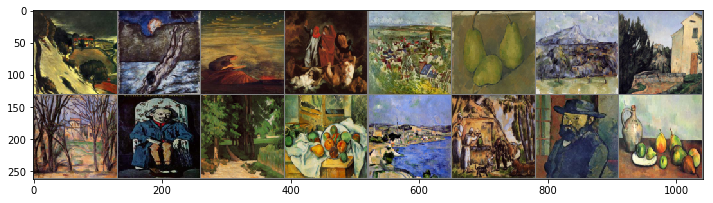

In [4]:
def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

# get some random images from X
dataiter = iter(dataloader_X)
# the "_" is a placeholder for no labels
images, _ = dataiter.next()

# show images
fig = plt.figure(figsize=(12, 8))
imshow(torchvision.utils.make_grid(images))

Next, let's visualize a batch of images from set $Y$.

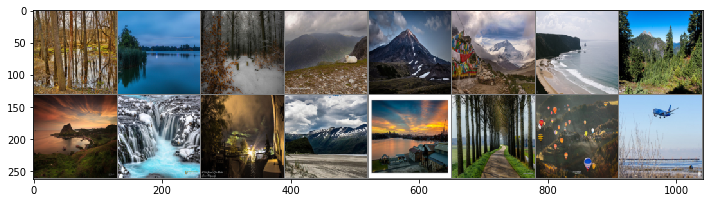

In [5]:
# get some random images from Y
dataiter = iter(dataloader_Y)
images, _ = dataiter.next()

# show images
fig = plt.figure(figsize=(12,8))
imshow(torchvision.utils.make_grid(images))

---
## Define the Model

A CycleGAN is made of discriminator and generator networks.

## Discriminators

The discriminators, $D_X$ and $D_Y$, in this CycleGAN are convolutional neural networks that see an image and attempt to classify it as real or fake. In this case, real is indicated by an output close to 1 and fake as close to 0. The discriminators have the following architecture:

<img src='notebook_images/dc_discriminator.png' width=70% />

This network sees a 128x128x3 image, and passes it through 5 convolutional layers that downsample the image by a factor of 2. The first four convolutional layers have a BatchNorm and ReLu activation function applied to their output, and the last acts as a 1x1 convolution.

### Convolutional Helper Function

To define the discriminators, you're expected to use the provided `conv` function, which creates a convolutional layer + an optional batch norm layer.

In [6]:
import torch.nn as nn
import torch.nn.functional as F

# helper conv function
def conv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=True):
    """Creates a convolutional layer, with optional batch normalization.
    """
    layers = []
    conv_layer = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride=stride, padding=padding, bias=False)
    layers.append(conv_layer)

    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))
    return nn.Sequential(*layers)

### Define the Discriminator Architecture

Your task is to fill in the `__init__` function with the specified 5 layer conv net architecture. Both $D_X$ and $D_Y$ have the same architecture, so we only need to define one class, and later instantiate two discriminators. 
> It's recommended that you use a **kernel size of 4x4** and use that to determine the correct stride and padding size for each layer. [This Stanford resource](http://cs231n.github.io/convolutional-networks/#conv) may also help in determining stride and padding sizes.

Once you've defined the layers of the discriminnator in `__init__`, fill in the forward behavior of the network. This forward function defines how an input image moves through the discriminator, and the most importan thing is to pass it through your convolutional layers in order, then shape the output and apply a sigmoid activation function at the end.

In [7]:
class Discriminator(nn.Module):
    """Defines the architecture of the discriminator network.
       Note: Both discriminators D_X and D_Y have the same architecture in this assignment.
    """
    def __init__(self, conv_dim=32):
        super(Discriminator, self).__init__()

        ###########################################
        ##   FILL THIS IN: CREATE ARCHITECTURE   ##
        ###########################################

        self.conv1 = conv(3, conv_dim, 4, batch_norm=False)
        self.conv2 = conv(conv_dim, conv_dim*2, 4)
        self.conv3 = conv(conv_dim*2, conv_dim*4, 4)
        self.conv4 = conv(conv_dim*4, conv_dim*8, 4)
        self.conv5 = conv(conv_dim*8, 1, 4, stride=1, padding=0, batch_norm=False)

    def forward(self, x):

        out = F.relu(self.conv1(x))
        out = F.relu(self.conv2(out))
        out = F.relu(self.conv3(out))
        out = F.relu(self.conv4(out))

        out = self.conv5(out).squeeze()
        out = F.sigmoid(out)
        return out

## Generators

The generators, `G_XtoY` and `G_YtoX` (sometimes called F), are made of a conv net that is responsible for turining an image into a smaller feature representation and a *transpose_conv* net that is responsible for turning that representation into a converted emoji type. These generators, one from XtoY and one from YtoX, have the following architecture:

<img src='notebook_images/cyclegan_generator.png' width=86% />

This network sees a 32x32x3 emoji image, compresses it into a feature representation as it goes through three convolutional layers and reaches a residual block. Then it goes through three transpose-convolutional layers (sometimes called *de-conv* layers) which upsample that feature representation and create a new image. Note that all the convolutional and transpose-convolutional layers have BatchNorm and ReLu functions applied to their outputs with the exception of the final transpose-convolutional layer, which has a tanh applied to the output.

### Transpose Convolutional Helper Function & Residual Block Class

To define the generators, you're expected to use the provided `conv` function, and the below `transpose_conv` and `ResnetBlock` class which will help you create the decoder portion of the generators.

In [8]:
# helper deconv functions
class ResnetBlock(nn.Module):
    """Defines a residual block that adds an input x to a conv_layer of the same size 
       that is applied to x.
    """
    
    def __init__(self, conv_dim):
        super(ResnetBlock, self).__init__()
        self.conv_layer = conv(in_channels=conv_dim, out_channels=conv_dim, kernel_size=3, stride=1, padding=1)

    def forward(self, x):
        out = x + self.conv_layer(x)
        return out

def deconv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=True):
    """Creates a transposed-convolutional layer, with optional batch normalization.
    """
    layers = []
    layers.append(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False))
    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))
    return nn.Sequential(*layers)

### Define the Generator Architecture

Fill in the the `__init__` function with the specified 3 layer conv net, residual block, then 3 layer deconv net architecture. Both $G_{XtoY}$ and $G_{YtoX}$ have the same architecture, so we only need to define one class, and later instantiate two generators.

Then complete the `forward` function to define the forward behavior of the generators. Recall that the last layer has a `tanh` activation function.

In [9]:
class CycleGenerator(nn.Module):
    """Defines the architecture of the generator network.
       Note: Both generators G_XtoY and G_YtoX have the same architecture in this assignment.
    """
    def __init__(self, conv_dim=32):
        super(CycleGenerator, self).__init__()

        ###########################################
        ##   FILL THIS IN: CREATE ARCHITECTURE   ##
        ###########################################

        # 1. Define the encoder part of the generator (that extracts features from the input image)
        self.conv1 = conv(3, conv_dim, 4)
        self.conv2 = conv(conv_dim, conv_dim*2, 4)
        self.conv3 = conv(conv_dim*2, conv_dim*4, 4)

        # 2. Define the transformation part of the generator
        self.resnet_block = ResnetBlock(conv_dim*4)

        # 3. Define the decoder part of the generator (that builds up the output image from features)
        self.deconv1 = deconv(conv_dim*4, conv_dim*2, 4)
        self.deconv2 = deconv(conv_dim*2, conv_dim, 4)
        self.deconv3 = deconv(conv_dim, 3, 4, batch_norm=False)

    def forward(self, x):
        """Generates an image conditioned on an input image.

            Input
            -----
                x: batch_size x 3 x 32 x 32

            Output
            ------
                out: batch_size x 3 x 32 x 32
        """

        out = F.relu(self.conv1(x))
        out = F.relu(self.conv2(out))
        out = F.relu(self.conv3(out))

        out = F.relu(self.resnet_block(out))

        out = F.relu(self.deconv1(out))
        out = F.relu(self.deconv2(out))
        out = F.tanh(self.deconv3(out))

        return out

---
## Create the complete network

Using the classes you defined earlier, you can define the discrimnators and generators necessary to create a complete CycleGAN.

First, create two discriminators, one for checking if $X$ sample images are real, and one for checking if $Y$ sample images are real. Then the generators. Instantiate two of them, one for transforming a painting into a realistic photo and one for transforming a photo into  into a painting.

In [10]:
def create_model(g_conv_dim=32, d_conv_dim=32):
    """Builds the generators and discriminators.
    """
    G_XtoY = CycleGenerator(conv_dim=g_conv_dim)
    G_YtoX = CycleGenerator(conv_dim=g_conv_dim)
    D_X = Discriminator(conv_dim=d_conv_dim)
    D_Y = Discriminator(conv_dim=d_conv_dim)

    # move models to GPU if device available
    if torch.cuda.is_available():
        device = torch.device("cuda:0")
        G_XtoY.to(device)
        G_YtoX.to(device)
        D_X.to(device)
        D_Y.to(device)
        print('Models moved to GPU.')

    return G_XtoY, G_YtoX, D_X, D_Y

In [11]:
# call your function
G_XtoY, G_YtoX, D_X, D_Y = create_model()

Models moved to GPU.


## Check that you've implemented this correctly

The function `create_model` should return the two generator and two discriminator networks. After you've defined these discriminator and generator components, it's good practice to check your work. The easiest way to do this is to print out your model architecture and read through it to make sure the parameters are what you expected. The next cell will print out their architectures.

In [12]:
# helper function for printing the model architecture
def print_models(G_XtoY, G_YtoX, D_X, D_Y):
    """Prints model information for the generators and discriminators.
    """
    print("                 G_XtoY                ")
    print("---------------------------------------")
    print(G_XtoY)
    print("---------------------------------------")

    print("                 G_YtoX                ")
    print("---------------------------------------")
    print(G_YtoX)
    print("---------------------------------------")

    print("                  D_X                  ")
    print("---------------------------------------")
    print(D_X)
    print("---------------------------------------")

    print("                  D_Y                  ")
    print("---------------------------------------")
    print(D_Y)
    print("---------------------------------------")
    

# print the entire model
print_models(G_XtoY, G_YtoX, D_X, D_Y)

                 G_XtoY                
---------------------------------------
CycleGenerator(
  (conv1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (resnet_block): ResnetBlock(
    (conv_layer): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (deconv1): Sequential(
    (0): ConvTr

## Discriminator and Generator Losses

Computing the discriminator and the generator losses are key to getting a CycleGAN to train.

<img src='notebook_images/CycleGAN_loss.png' width=90% height=90% />
**Image from [original paper](https://arxiv.org/abs/1703.10593) by Jun-Yan Zhu et. al.**

* The CycleGAN contains two mapping functions $G: X \rightarrow Y$ and $F: Y \rightarrow X$, and associated adversarial discriminators $D_Y$ and $D_X$. **(a)** $D_Y$ encourages $G$ to translate $X$ into outputs indistinguishable from domain $Y$, and vice versa for $D_X$ and $F$.

* To further regularize the mappings, we introduce two cycle consistency losses that capture the intuition that if
we translate from one domain to the other and back again we should arrive at where we started. **(b)** Forward cycle-consistency loss and **(c)** backward cycle-consistency loss.

### Discriminator Loss

The discriminator losses are typically mean squared errors between the output of the discriminator, given an image, and the target value, 0 or 1, depending on whether it should classify that image as fake or real. For example, for a *real* image, `x`, we can train $D_X$ by looking at how close it is to recognizing and image `x` as real using the mean squared error:

```
out_x = D_X(x)
real_err = torch.mean((out_x-1)**2)
```

For a *fake*, generated image, `x_hat`, we want to measure how close the output of the discriminator, applied to `x_hat`, is to being classified as fake:

```
out_x_hat = D_X(x_hat)
fake_err = torch.mean(out_x_hat**2)
```

You may be wondering what to do since we have two discriminators to train, $D_X$ and $D_Y$. We'll actually break this up into two losses: `d_real_loss` and `d_fake_loss` which both have x and y mean squared error components. These will be added together to get the complete real and fake loss terms.

### Generator Loss

Calculating the generator loss will look somewhat similar to calculating the discriminator loss; there will still be steps in which you generate fake images that look like they belong to the set of $X$ images but are based on real images in set $Y$, and vice versa. Then you'll compute the mean squared error, discriminator loss on those generated images; this time, your generator aims to make the discriminator classify these fake images as *real* images. 

#### Cycle Consistency Loss

In addition to the "is this a good fake" adversarial losses, the generator will also include the **cycle consistency loss**. This loss is a measure of how good a reconstructed image is. 

Say you have a fake, generated image, `x_hat`, and a real image, `y`. You can get a reconstructed `y` by applying `G_XtoY(x_hat)` and then check to see if the reconstruction and real images match. For this, we recommed calculating the L1 loss, which is an absolute difference, between reconstructed and real images. You may also choose to multiply this loss by some weight value `lambda_weight` to convey its importance.

<img src='notebook_images/reconstruction_error.png' width=40% height=40% />

The complete loss will be the sum of the mean squared errors and this cycle consistency loss.

---
### Define Loss Functions

To help us calculate the discriminator and gnerator losses during training, let's define some helpful loss functions. Here, we'll define three.
1. `real_mse_loss` that looks at the output of a discriminator and returns the error based on how close that output is to being classified as real. This should be a mean squared error.
2. `fake_mse_loss` that looks at the output of a discriminator and returns the error based on how close that output is to being classified as fake. This should be a mean squared error.
3. `cycle_consistency_loss` that looks at a set of real image and a set of reconstructed/generated images, and returns the mean absolute error between them. This has a `lambda_weight` parameter that will weight the mean absolute error in a batch.

It's recommended that you take a [look at the original, CycleGAN paper](https://arxiv.org/pdf/1703.10593.pdf) to get a starting value for `lambda_weight`.



In [13]:
def real_mse_loss(output):
    # how close is the produced output from being "real"?
    return torch.mean((output-1)**2)

def fake_mse_loss(output):
    # how close is the produced output from being "false"?
    return torch.mean(output**2)

def cycle_consistency_loss(real_im, reconstructed_im, lambda_weight=10):
    # calculate reconstruction loss
    # reconstr_loss = torch.abs((real_im - reconstructed_im))
    reconstr_loss = torch.mean(torch.abs(real_im - reconstructed_im))
    # return weighted loss
    return lambda_weight*reconstr_loss
    


### Define the Optimizers

Next, let's define how this model will update its weights. This, like the GANs you may have seen before, uses [Adam](https://pytorch.org/docs/stable/optim.html#algorithms) optimizers for the discriminator and generator. It's again recommended that you take a [look at the original, CycleGAN paper](https://arxiv.org/pdf/1703.10593.pdf) to get starting hyperparameter values.


In [14]:
import torch.optim as optim

# hyperparams for Adam optimizer
lr=0.0002
beta1=0.5
beta2=0.999 # default value

g_params = list(G_XtoY.parameters()) + list(G_YtoX.parameters())  # Get generator parameters
d_params = list(D_X.parameters()) + list(D_Y.parameters())  # Get discriminator parameters

# Create optimizers for the generators and discriminators
g_optimizer = optim.Adam(g_params, lr, [beta1, beta2])
d_optimizer = optim.Adam(d_params, lr, [beta1, beta2])

---

## Training a CycleGAN

When a CycleGAN trains, and sees one batch of real images from set $X$ and $Y$, it trains by performing the following steps:

**Training the Discriminators**
1. Compute the discriminator losses, for $D_X$ and $D_Y$, on the real images
2. Generate fake images that look like domain $X$ based on real images in domain $Y$
3. Compute the loss for $D_X$ when it sees fake $X$
4. Generate fake images that look like domain $Y$ based on real images in domain $X$
5. Compute the loss for $D_Y$ when it sees fake $Y$

**Training the Generators**
1. Generate fake images that look like domain $X$ based on real images in domain $Y$
2. Compute the generator loss based on how $D_X$ responds to fake $X$
1. Generate fake images that look like domain $Y$ based on real images in domain $X$
2. Compute the generator loss based on how $D_Y$ responds to fake $Y$

<img src='notebook_images/training_cycle_ex.png' width=70% height=70% />


### Saving Your Progress

A CycleGAN repeats its training process, alternating between training the discriminators and the generators, for a specified number of training iterations. You've been given code that will save some example fake emoji's that the CycleGAN has learned to generate after a certain number of training iterations. Along with looking at the losses, these example generations should give you an idea of how well your network has trained.

Below, you may choose to keep all default parameters; you're only task is to calculate the appropriate losses and complete the training cycle.

In [15]:
# import save code
from helpers import save_samples, checkpoint

In [16]:
# train the network

train_iters = 4000 # keep this small when testing if a model first works, then increase it to >2000

def training_loop(dataloader_X, dataloader_Y, test_dataloader_X, test_dataloader_Y, 
                  train_iters=train_iters, log_step=10):
    """Runs the training loop.
    """
    
    # keep track of losses over time
    losses = []

    iter_X = iter(dataloader_X)
    iter_Y = iter(dataloader_Y)

    test_iter_X = iter(test_dataloader_X)
    test_iter_Y = iter(test_dataloader_Y)

    # Get some fixed data from domains X and Y for sampling. These are images that are held
    # constant throughout training, that allow us to inspect the model's performance.
    fixed_X = test_iter_X.next()[0]
    fixed_Y = test_iter_Y.next()[0]

    iter_per_epoch = min(len(iter_X), len(iter_Y))

    for iteration in range(1, train_iters+1):

        # Reset data_iter for each epoch
        if iteration % iter_per_epoch == 0:
            iter_X = iter(dataloader_X)
            iter_Y = iter(dataloader_Y)

        images_X, _ = iter_X.next()

        images_Y, _ = iter_Y.next()
        
        # move images to GPU if available (otherwise stay on CPU)
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        images_X = images_X.to(device)
        images_Y = images_Y.to(device)


        # ============================================
        #            TRAIN THE DISCRIMINATORS
        # ============================================

        #########################################
        ##             FILL THIS IN            ##
        #########################################

        # Train with real images
        d_optimizer.zero_grad()

        # 1. Compute the discriminator losses on real images
        out_x = D_X(images_X)
        D_X_loss = real_mse_loss(out_x)
        
        out_y = D_Y(images_Y)
        D_Y_loss = real_mse_loss(out_y)

        d_real_loss = D_X_loss + D_Y_loss
        d_real_loss.backward()
        d_optimizer.step()

        # Train with fake images
        d_optimizer.zero_grad()

        # 2. Generate fake images that look like domain X based on real images in domain Y
        fake_X = G_YtoX(images_Y)

        # 3. Compute the loss for D_X
        out_x = D_X(fake_X)
        D_X_loss = fake_mse_loss(out_x)

        # 4. Generate fake images that look like domain Y based on real images in domain X
        # fake_Y = ...
        fake_Y = G_XtoY(images_X)

        # 5. Compute the loss for D_Y
        # D_Y_loss = ...
        out_y = D_Y(fake_Y)
        D_Y_loss = fake_mse_loss(out_y)

        d_fake_loss = D_X_loss + D_Y_loss
        d_fake_loss.backward()
        d_optimizer.step()



        # =========================================
        #            TRAIN THE GENERATORS
        # =========================================


        #########################################
        ##    FILL THIS IN: Y--X-->Y CYCLE     ##
        #########################################
        g_optimizer.zero_grad()

        # 1. Generate fake images that look like domain X based on real images in domain Y
        # fake_X = ...
        fake_X = G_YtoX(images_Y)

        # 2. Compute the generator loss based on domain X
        # g_loss = ...
        out_x = D_X(fake_X)
        g_loss = real_mse_loss(out_x)

        # 3. Compute the cycle consistency loss (the reconstruction loss)
        # Calculate the reconstruction
        reconstructed_Y = G_XtoY(fake_X)
        cycle_loss = cycle_consistency_loss(images_Y,reconstructed_Y)
        g_loss += cycle_loss

        g_loss.backward()
        g_optimizer.step()


        #########################################
        ##    FILL THIS IN: X--Y-->X CYCLE     ##
        #########################################

        g_optimizer.zero_grad()

        # 1. Generate fake images that look like domain Y based on real images in domain X
        # fake_Y = ...
        fake_Y = G_XtoY(images_X)

        # 2. Compute the generator loss based on domain Y
        # g_loss = ...
        out_y = D_Y(fake_Y)
        g_loss = real_mse_loss(out_y)

        # 3. Compute the cycle consistency loss (the reconstruction loss)
        reconstructed_X = G_YtoX(fake_Y)
        cycle_loss = cycle_loss = cycle_consistency_loss(images_X,reconstructed_X)
        g_loss += cycle_loss

        g_loss.backward()
        g_optimizer.step()


        # Print the log info
        if iteration % log_step == 0:
            # append real and fake discriminator losses and the generator loss
            losses.append((d_real_loss.item(), d_fake_loss.item(), g_loss.item()))
            print('Iteration [{:5d}/{:5d}] | d_real_loss: {:6.4f} | d_Y_loss: {:6.4f} | d_X_loss: {:6.4f} | '
                  'd_fake_loss: {:6.4f} | g_loss: {:6.4f}'.format(
                    iteration, train_iters, d_real_loss.item(), D_Y_loss.item(),
                    D_X_loss.item(), d_fake_loss.item(), g_loss.item()))

            
        sample_every=100
        # Save the generated samples
        if iteration % sample_every == 0:
            save_samples(iteration, fixed_Y, fixed_X, G_YtoX, G_XtoY, batch_size=16)

        # uncomment these lines, if you want to save your model
#         checkpoint_every=800
#         # Save the model parameters
#         if iteration % checkpoint_every == 0:
#             checkpoint(iteration, G_XtoY, G_YtoX, D_X, D_Y)
       
    return losses


In [17]:
losses = training_loop(dataloader_X, dataloader_Y, test_dataloader_X, test_dataloader_Y)

Iteration [   10/ 4000] | d_real_loss: 0.3517 | d_Y_loss: 0.1804 | d_X_loss: 0.2023 | d_fake_loss: 0.3827 | g_loss: 4.3022
Iteration [   20/ 4000] | d_real_loss: 0.3384 | d_Y_loss: 0.1457 | d_X_loss: 0.1298 | d_fake_loss: 0.2755 | g_loss: 3.1037
Iteration [   30/ 4000] | d_real_loss: 0.2270 | d_Y_loss: 0.1270 | d_X_loss: 0.0548 | d_fake_loss: 0.1818 | g_loss: 3.0535
Iteration [   40/ 4000] | d_real_loss: 0.1611 | d_Y_loss: 0.1044 | d_X_loss: 0.0930 | d_fake_loss: 0.1974 | g_loss: 3.4180
Iteration [   50/ 4000] | d_real_loss: 0.1861 | d_Y_loss: 0.0543 | d_X_loss: 0.1264 | d_fake_loss: 0.1807 | g_loss: 2.9331
Iteration [   60/ 4000] | d_real_loss: 0.1313 | d_Y_loss: 0.1030 | d_X_loss: 0.0576 | d_fake_loss: 0.1606 | g_loss: 2.7362
Iteration [   70/ 4000] | d_real_loss: 0.2629 | d_Y_loss: 0.0520 | d_X_loss: 0.1445 | d_fake_loss: 0.1966 | g_loss: 3.1886
Iteration [   80/ 4000] | d_real_loss: 0.6019 | d_Y_loss: 0.1671 | d_X_loss: 0.3332 | d_fake_loss: 0.5003 | g_loss: 2.5802
Iteration [   90

Iteration [  640/ 4000] | d_real_loss: 0.4457 | d_Y_loss: 0.2615 | d_X_loss: 0.2118 | d_fake_loss: 0.4733 | g_loss: 2.0322
Iteration [  650/ 4000] | d_real_loss: 0.4608 | d_Y_loss: 0.2076 | d_X_loss: 0.1622 | d_fake_loss: 0.3698 | g_loss: 2.0750
Iteration [  660/ 4000] | d_real_loss: 0.2176 | d_Y_loss: 0.0844 | d_X_loss: 0.1496 | d_fake_loss: 0.2340 | g_loss: 2.0529
Iteration [  670/ 4000] | d_real_loss: 0.3390 | d_Y_loss: 0.1572 | d_X_loss: 0.2463 | d_fake_loss: 0.4034 | g_loss: 2.1418
Iteration [  680/ 4000] | d_real_loss: 0.2857 | d_Y_loss: 0.1687 | d_X_loss: 0.1273 | d_fake_loss: 0.2960 | g_loss: 1.9033
Iteration [  690/ 4000] | d_real_loss: 0.3412 | d_Y_loss: 0.1629 | d_X_loss: 0.1429 | d_fake_loss: 0.3058 | g_loss: 2.0513
Iteration [  700/ 4000] | d_real_loss: 0.3235 | d_Y_loss: 0.1859 | d_X_loss: 0.1576 | d_fake_loss: 0.3435 | g_loss: 1.8703
Saved samples_cyclegan/sample-000700-X-Y.png
Saved samples_cyclegan/sample-000700-Y-X.png
Iteration [  710/ 4000] | d_real_loss: 0.4275 | d

Iteration [ 1270/ 4000] | d_real_loss: 0.1908 | d_Y_loss: 0.1581 | d_X_loss: 0.0474 | d_fake_loss: 0.2056 | g_loss: 1.9342
Iteration [ 1280/ 4000] | d_real_loss: 0.1866 | d_Y_loss: 0.1745 | d_X_loss: 0.0965 | d_fake_loss: 0.2711 | g_loss: 2.0639
Iteration [ 1290/ 4000] | d_real_loss: 0.2583 | d_Y_loss: 0.1637 | d_X_loss: 0.0564 | d_fake_loss: 0.2200 | g_loss: 2.2119
Iteration [ 1300/ 4000] | d_real_loss: 0.2308 | d_Y_loss: 0.1540 | d_X_loss: 0.0968 | d_fake_loss: 0.2508 | g_loss: 2.0441
Saved samples_cyclegan/sample-001300-X-Y.png
Saved samples_cyclegan/sample-001300-Y-X.png
Iteration [ 1310/ 4000] | d_real_loss: 0.2491 | d_Y_loss: 0.1015 | d_X_loss: 0.0734 | d_fake_loss: 0.1749 | g_loss: 2.0110
Iteration [ 1320/ 4000] | d_real_loss: 0.1529 | d_Y_loss: 0.1268 | d_X_loss: 0.0774 | d_fake_loss: 0.2042 | g_loss: 2.0225
Iteration [ 1330/ 4000] | d_real_loss: 0.2711 | d_Y_loss: 0.2304 | d_X_loss: 0.0297 | d_fake_loss: 0.2601 | g_loss: 1.7899
Iteration [ 1340/ 4000] | d_real_loss: 0.2240 | d

Iteration [ 1900/ 4000] | d_real_loss: 0.2088 | d_Y_loss: 0.1239 | d_X_loss: 0.0350 | d_fake_loss: 0.1589 | g_loss: 1.9171
Saved samples_cyclegan/sample-001900-X-Y.png
Saved samples_cyclegan/sample-001900-Y-X.png
Iteration [ 1910/ 4000] | d_real_loss: 0.2642 | d_Y_loss: 0.1374 | d_X_loss: 0.0183 | d_fake_loss: 0.1557 | g_loss: 1.9522
Iteration [ 1920/ 4000] | d_real_loss: 0.1503 | d_Y_loss: 0.0687 | d_X_loss: 0.0441 | d_fake_loss: 0.1128 | g_loss: 1.9461
Iteration [ 1930/ 4000] | d_real_loss: 0.2211 | d_Y_loss: 0.1872 | d_X_loss: 0.0407 | d_fake_loss: 0.2279 | g_loss: 1.8692
Iteration [ 1940/ 4000] | d_real_loss: 0.2488 | d_Y_loss: 0.1133 | d_X_loss: 0.0499 | d_fake_loss: 0.1632 | g_loss: 1.8523
Iteration [ 1950/ 4000] | d_real_loss: 0.2011 | d_Y_loss: 0.1691 | d_X_loss: 0.0341 | d_fake_loss: 0.2032 | g_loss: 1.9832
Iteration [ 1960/ 4000] | d_real_loss: 0.1829 | d_Y_loss: 0.1504 | d_X_loss: 0.0211 | d_fake_loss: 0.1715 | g_loss: 2.6131
Iteration [ 1970/ 4000] | d_real_loss: 0.1418 | d

Iteration [ 2520/ 4000] | d_real_loss: 0.1245 | d_Y_loss: 0.0565 | d_X_loss: 0.0107 | d_fake_loss: 0.0672 | g_loss: 1.8420
Iteration [ 2530/ 4000] | d_real_loss: 0.0690 | d_Y_loss: 0.0760 | d_X_loss: 0.0103 | d_fake_loss: 0.0863 | g_loss: 1.8472
Iteration [ 2540/ 4000] | d_real_loss: 0.2100 | d_Y_loss: 0.1018 | d_X_loss: 0.0033 | d_fake_loss: 0.1051 | g_loss: 2.4131
Iteration [ 2550/ 4000] | d_real_loss: 0.1383 | d_Y_loss: 0.1594 | d_X_loss: 0.0117 | d_fake_loss: 0.1711 | g_loss: 1.9084
Iteration [ 2560/ 4000] | d_real_loss: 0.0261 | d_Y_loss: 0.0648 | d_X_loss: 0.0024 | d_fake_loss: 0.0672 | g_loss: 2.4849
Iteration [ 2570/ 4000] | d_real_loss: 0.1338 | d_Y_loss: 0.0409 | d_X_loss: 0.0141 | d_fake_loss: 0.0550 | g_loss: 2.2913
Iteration [ 2580/ 4000] | d_real_loss: 0.1172 | d_Y_loss: 0.0727 | d_X_loss: 0.0150 | d_fake_loss: 0.0877 | g_loss: 1.8044
Iteration [ 2590/ 4000] | d_real_loss: 0.2920 | d_Y_loss: 0.1061 | d_X_loss: 0.0754 | d_fake_loss: 0.1815 | g_loss: 1.7701
Iteration [ 2600

Iteration [ 3150/ 4000] | d_real_loss: 0.1378 | d_Y_loss: 0.1213 | d_X_loss: 0.0066 | d_fake_loss: 0.1279 | g_loss: 1.8286
Iteration [ 3160/ 4000] | d_real_loss: 0.1316 | d_Y_loss: 0.0379 | d_X_loss: 0.0152 | d_fake_loss: 0.0531 | g_loss: 2.2362
Iteration [ 3170/ 4000] | d_real_loss: 0.1303 | d_Y_loss: 0.1634 | d_X_loss: 0.0014 | d_fake_loss: 0.1648 | g_loss: 2.1317
Iteration [ 3180/ 4000] | d_real_loss: 0.0575 | d_Y_loss: 0.0439 | d_X_loss: 0.0079 | d_fake_loss: 0.0518 | g_loss: 1.9337
Iteration [ 3190/ 4000] | d_real_loss: 0.0891 | d_Y_loss: 0.0467 | d_X_loss: 0.0060 | d_fake_loss: 0.0527 | g_loss: 1.8985
Iteration [ 3200/ 4000] | d_real_loss: 0.1365 | d_Y_loss: 0.2557 | d_X_loss: 0.0125 | d_fake_loss: 0.2682 | g_loss: 2.0700
Saved samples_cyclegan/sample-003200-X-Y.png
Saved samples_cyclegan/sample-003200-Y-X.png
Iteration [ 3210/ 4000] | d_real_loss: 0.0485 | d_Y_loss: 0.0186 | d_X_loss: 0.0209 | d_fake_loss: 0.0395 | g_loss: 2.5002
Iteration [ 3220/ 4000] | d_real_loss: 0.0868 | d

Iteration [ 3780/ 4000] | d_real_loss: 0.0269 | d_Y_loss: 0.0374 | d_X_loss: 0.0006 | d_fake_loss: 0.0380 | g_loss: 1.9607
Iteration [ 3790/ 4000] | d_real_loss: 0.0466 | d_Y_loss: 0.0719 | d_X_loss: 0.0026 | d_fake_loss: 0.0745 | g_loss: 1.9750
Iteration [ 3800/ 4000] | d_real_loss: 0.0604 | d_Y_loss: 0.1061 | d_X_loss: 0.0020 | d_fake_loss: 0.1081 | g_loss: 2.0436
Saved samples_cyclegan/sample-003800-X-Y.png
Saved samples_cyclegan/sample-003800-Y-X.png
Iteration [ 3810/ 4000] | d_real_loss: 0.1424 | d_Y_loss: 0.0485 | d_X_loss: 0.0009 | d_fake_loss: 0.0494 | g_loss: 1.9063
Iteration [ 3820/ 4000] | d_real_loss: 0.0795 | d_Y_loss: 0.0577 | d_X_loss: 0.0023 | d_fake_loss: 0.0600 | g_loss: 1.9586
Iteration [ 3830/ 4000] | d_real_loss: 0.3015 | d_Y_loss: 0.3952 | d_X_loss: 0.0019 | d_fake_loss: 0.3971 | g_loss: 2.0182
Iteration [ 3840/ 4000] | d_real_loss: 0.0335 | d_Y_loss: 0.0526 | d_X_loss: 0.0023 | d_fake_loss: 0.0550 | g_loss: 2.2037
Iteration [ 3850/ 4000] | d_real_loss: 0.0651 | d

## Display the losses

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. It's often a good starting point to look at existing papers to find what has worked in previous experiments, I'd recommend this [DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) in addition to the original [CycleGAN paper](https://arxiv.org/pdf/1703.10593.pdf) to see what worked for them. Then you can try your own experiments based off of a good foundation.

#### Discriminator Loss

When you display the generator and discriminator losses you should see that there is always some discriminator loss; recall that we are trying to design a model that can generate good "fake" images. So, the ideal discriminator will not be able to tell the difference between real and fake images and, as such, will always have some loss. The real and fake losses should be roughly equal as should the $D_X$ and $D_Y$; if they are not then for some reason your model is favoring one type of discrimination over another and you may need to look at biases in your model or data.

#### Generator Loss

The generator's loss should decrease at the start of training because initial, generated images are often far-off from being good fakes. After some time it may level off, this is normal since the generator and discriminator are both improving as they train. If you see that the loss is jumping around a lot, over time, you may want to try decreasing your learning rates or changing your cycle consistency loss to be a little more/less weighted or to be a _squared_ error term.


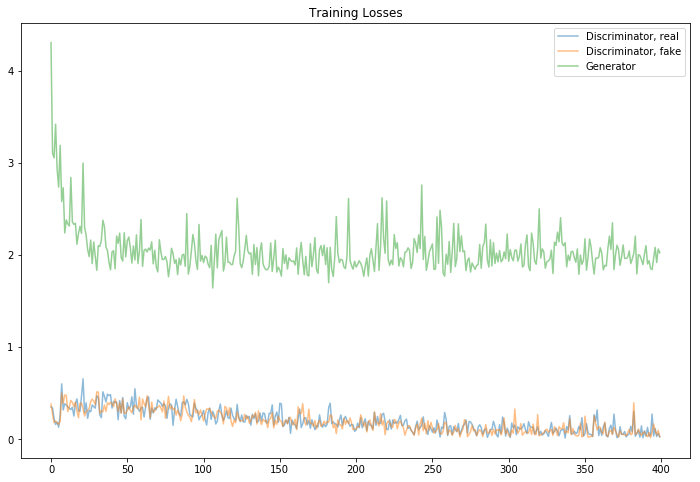

In [18]:
fig, ax = plt.subplots(figsize=(12,8))
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator, real', alpha=0.5)
plt.plot(losses.T[1], label='Discriminator, fake', alpha=0.5)
plt.plot(losses.T[2], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

---
## Evaluate the Result!

As you trained this model, you may have chosen to sample and save the results of your generated images after a certain number of training iterations. This gives you a way to see whether or not your Generator network is creating *good* fake images. For example, the image below depicts real images in the $Y$ set, and the corresponding generated (painting-like) images during different points in the training process. You can see that the generator starts out creating very noisy, fake images, but begins to converge to better paintings as it trains (though, not perfect).

<img src='notebook_images/photo2cezanne_4000.png' width=50% height=50% />

Below, you've been given a helper function for displaying generated samples based on the passed in training iteration.

In [19]:
## TODO: view samples..
import matplotlib.image as mpimg

def view_samples(iteration, sample_dir='samples_cyclegan'):
    
    # samples are named by iteration
    path_XtoY = os.path.join(sample_dir, 'sample-{:06d}-X-Y.png'.format(iteration))
    path_YtoX = os.path.join(sample_dir, 'sample-{:06d}-Y-X.png'.format(iteration))
    
    # read in those samples
    try: 
        x2y = mpimg.imread(path_XtoY)
        y2x = mpimg.imread(path_YtoX)
    except:
        print('Invalid number of iterations.')
    
    fig, (ax1, ax2) = plt.subplots(figsize=(20,5), nrows=1, ncols=2, sharey=True, sharex=True)
    ax1.imshow(x2y)
    ax1.set_title('X to Y')
    ax2.imshow(y2x)
    ax2.set_title('Y to X')


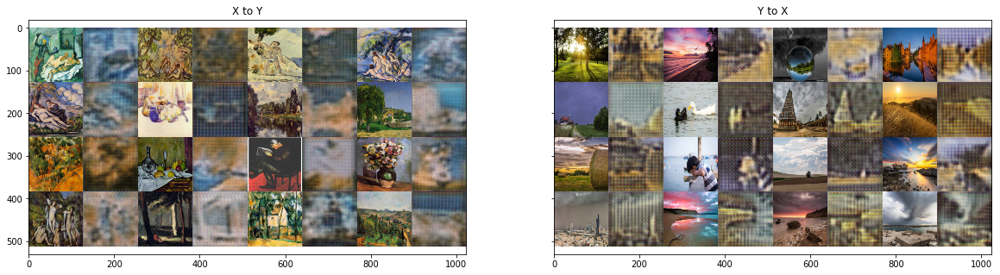

In [20]:
# view samples at iteration 100
# display the existing sample data from a complete, trained model
view_samples(100, 'samples_cyclegan')

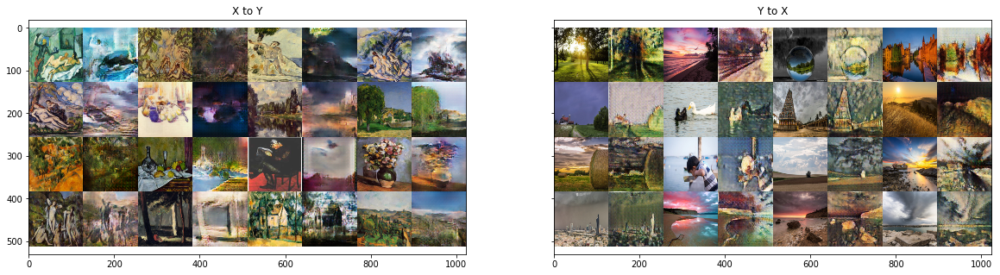

In [23]:
# view samples at iteration 4000
view_samples(4000, 'samples_cyclegan')

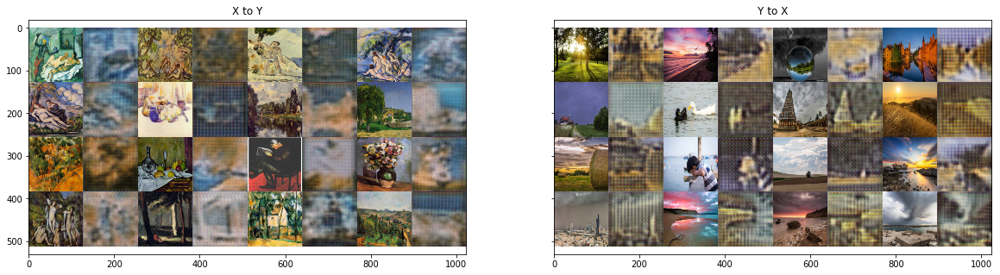

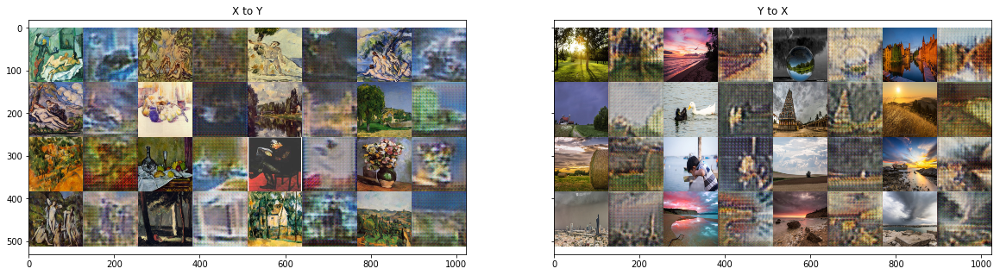

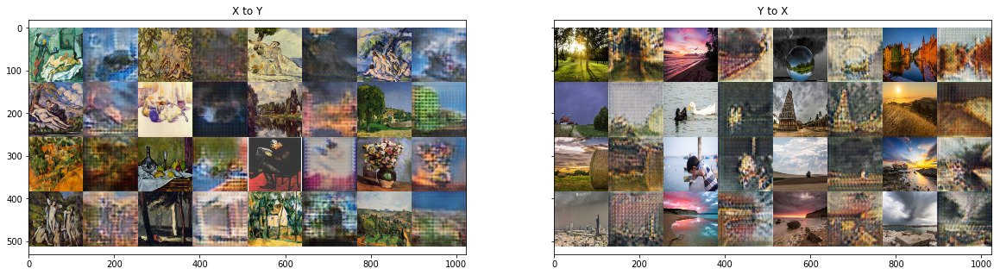

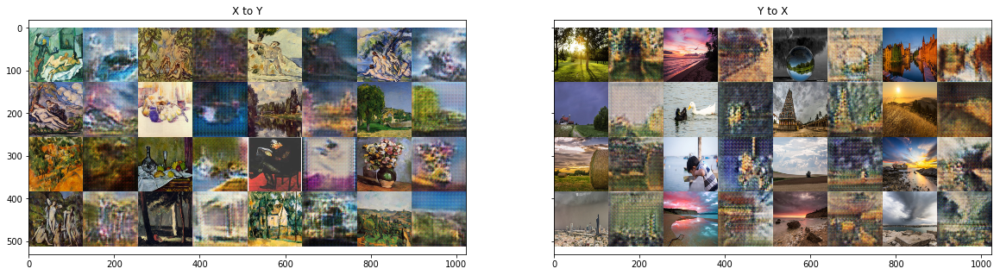

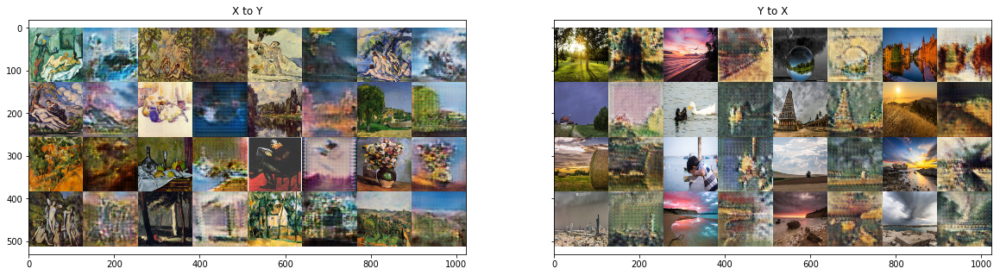

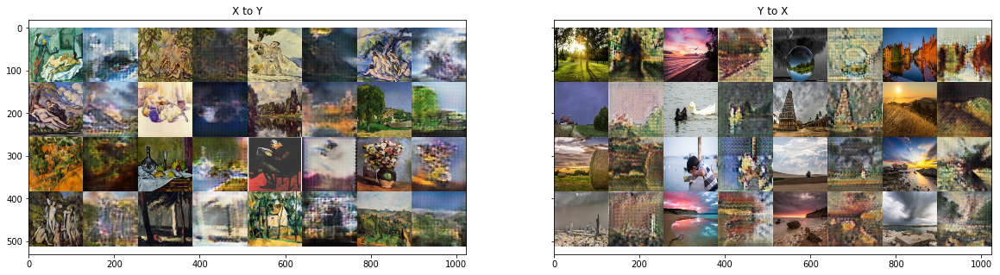

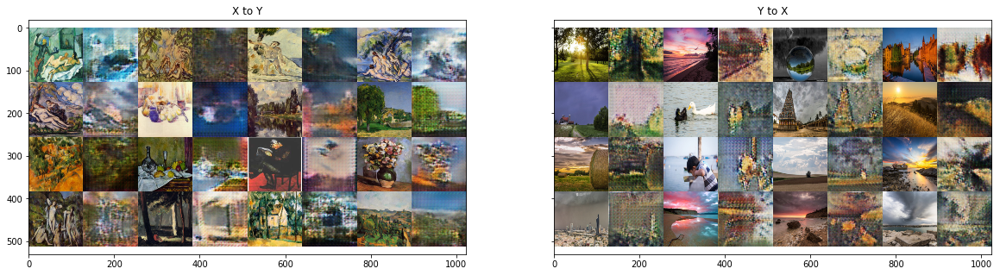

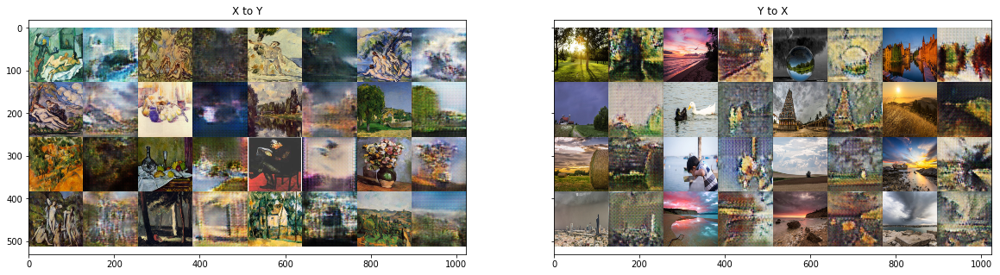

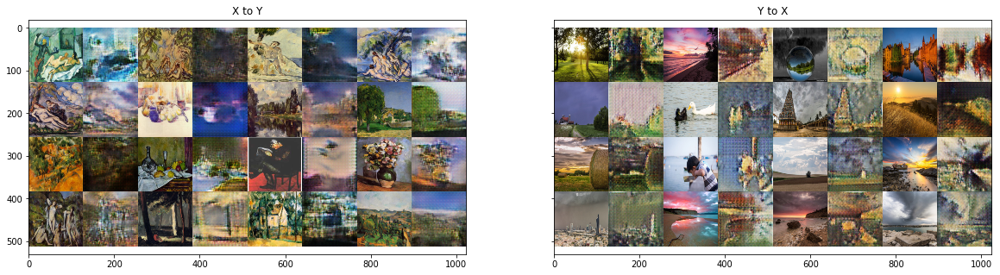

In [22]:
# plot a few rows in a sequence to see how the generated images
# start off very noisy, and become more image-like, over time

for i in range(9):
    view_samples((i+1)*100, 'samples_cyclegan')


---
## Further Challenges and Directions

* One shortcoming of this model is that it produces fairly low-resolution images; this is an ongoing area of research; you can read about a higher-resolution formulation that uses a multi-scale generator model, in [this paper](https://arxiv.org/abs/1711.11585).
* This model struggles with matching colors exactly. This is because, if $G$ and $F$ change the tint of an image, the cycle consistency loss may not be affected and can still be small. You could choose to introduce a new, color-based loss term that compares $G_YtoX(y)$ and $y$, and $G_XtoY(x)$ and $x$, but then this becomes a supervised learning approach. 
* This unsupervised approach also struggles with geometric changes, like changing the apparent size of individual object in an image, so it is best suited for stylistic transformations.
* It may help your model to converge faster, if you initialize the weights in your network.

**Once you are satified with your model, you are ancouraged to test it on a different dataset to see if it can find different types of mappings!**